In [2]:
!pip install category_encoders
!pip install bayesian-optimization
!pip install autoviz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.5/18.5 MB 54.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 358.9/358.9 kB 28.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 80.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 100.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 79.5 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of panel to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 70.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 70.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 17.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 73.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/2

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

from sklearn.metrics import mean_squared_error,mean_squared_log_error
from sklearn.model_selection import train_test_split,KFold,StratifiedKFold,GridSearchCV,RandomizedSearchCV,cross_val_score,RepeatedKFold
from sklearn.preprocessing import StandardScaler,MinMaxScaler,Normalizer,RobustScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import PolynomialFeatures

import xgboost as xgb
import lightgbm as lgb
import sklearn.ensemble as ensemble
import sklearn.metrics as metrics
from sklearn.ensemble import RandomForestClassifier,BaggingClassifier,AdaBoostClassifier,GradientBoostingClassifier,RandomForestRegressor,BaggingRegressor,AdaBoostRegressor,GradientBoostingRegressor
from sklearn.linear_model import LinearRegression,LogisticRegression,Lasso, Ridge,LogisticRegressionCV,RidgeCV,LassoCV,ElasticNetCV,OrthogonalMatchingPursuit,ElasticNet,LassoLarsCV,BayesianRidge
from sklearn.tree import DecisionTreeClassifier,DecisionTreeRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier,KNeighborsRegressor
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC,SVR
from scipy import stats
from scipy.stats import norm, skew
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.pipeline import make_pipeline
from sklearn.kernel_ridge import KernelRidge


from category_encoders.ordinal import OrdinalEncoder
from category_encoders.woe import WOEEncoder
from category_encoders.target_encoder import TargetEncoder
from category_encoders.sum_coding import SumEncoder
from category_encoders.m_estimate import MEstimateEncoder
from category_encoders.leave_one_out import LeaveOneOutEncoder
from category_encoders.helmert import HelmertEncoder
from category_encoders.cat_boost import CatBoostEncoder
from category_encoders.james_stein import JamesSteinEncoder
from category_encoders.one_hot import OneHotEncoder
from scipy.special import boxcox1p
from bayes_opt import BayesianOptimization

In [47]:
train=pd.read_csv('Traindata.csv')
test=pd.read_csv('DataSetRetail.csv')

In [7]:
test.head()

,record_ID,week,store_id,sku_id,total_price,base_price,is_featured_sku,is_display_sku
0,212645,16-07-2013,8091,216418,108.3000,108.3000,0,0
1,212646,16-07-2013,8091,216419,109.0125,109.0125,0,0
2,212647,16-07-2013,8091,216425,133.9500,133.9500,0,0
3,212648,16-07-2013,8091,216233,133.9500,133.9500,0,0
4,212649,16-07-2013,8091,217390,176.7000,176.7000,0,0


In [8]:
train.isna().sum()

record_ID          0
week               0
store_id           0
sku_id             0
total_price        1
base_price         0
is_featured_sku    0
is_display_sku     0
units_sold         0
dtype: int64

In [44]:
train.total_price=train.total_price.fillna(469.5375)

    Since nrows is smaller than dataset, loading random sample of 90000 rows into pandas...
Shape of your Data Set loaded: (90000, 27)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    26 Predictors classified...
        2 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['record_ID', 'count_id_sku_store']
Since Number of Rows in data 90000 exceeds maximum, randomly sampling 90000 rows for EDA...

################ Regression problem #####################
To fix data quality issues automatically, import FixDQ from autoviz...


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
week,object,0.000000,0,nan,nan,"130 rare categories: Too many to list. Group them into a single category or drop the categories., high cardinality with 130 unique values: Use hash encoding or embedding to reduce dimension."
store_id,int64,0.000000,0,8023.000000,9984.000000,No issue
sku_id,int64,0.000000,0,216233.000000,679023.000000,has 16203 outliers greater than upper bound (287519.50) or lower than lower bound(175035.50). Cap them or remove them.
total_price,float64,0.000000,NA,41.325000,562.162500,has 7160 outliers greater than upper bound (388.67) or lower than lower bound(-24.58). Cap them or remove them.
base_price,float64,0.000000,NA,61.275000,562.162500,"has 10222 outliers greater than upper bound (386.17) or lower than lower bound(-18.52). Cap them or remove them., has a high correlation with ['total_price']. Consider dropping one of them."
is_featured_sku,int64,0.000000,0,0.000000,1.000000,has 8664 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.
is_display_sku,int64,0.000000,0,0.000000,1.000000,has 11970 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.
count_id_sku,float64,0.000000,NA,130.000000,9750.000000,has 408 outliers greater than upper bound (14950.00) or lower than lower bound(390.00). Cap them or remove them.
count_id_store,float64,0.000000,NA,260.000000,3120.000000,has 987 outliers greater than upper bound (3445.00) or lower than lower bound(845.00). Cap them or remove them.
count_sku_store_id,float64,0.000000,NA,7.784615,248.376923,has 4358 outliers greater than upper bound (127.07) or lower than lower bound(-35.43). Cap them or remove them.


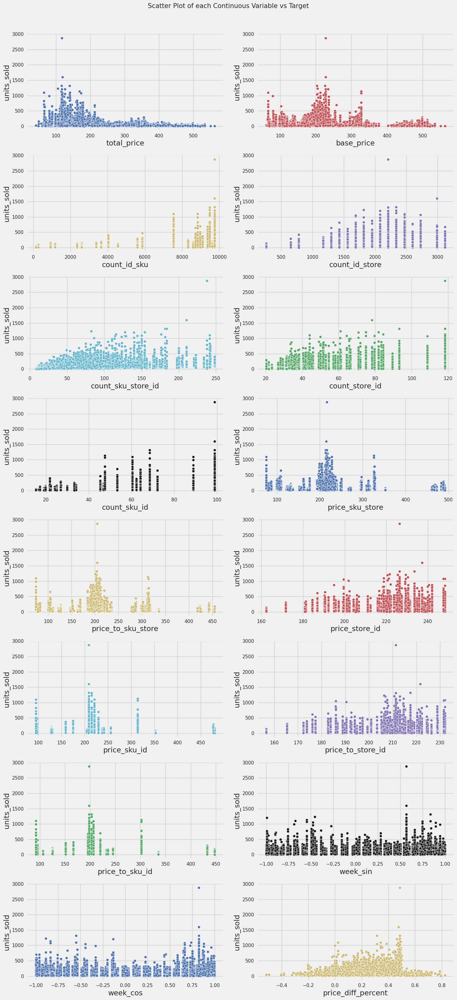

Number of All Scatter Plots = 136


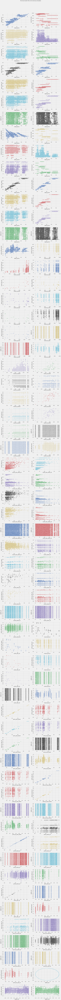

Could not draw some Distribution Plots


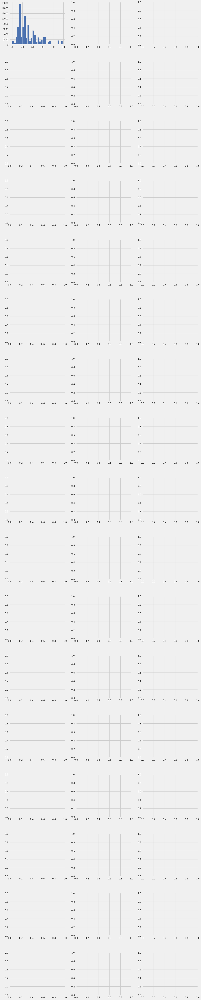

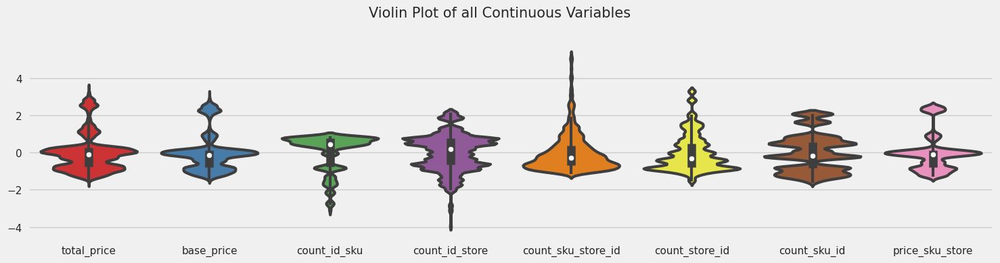

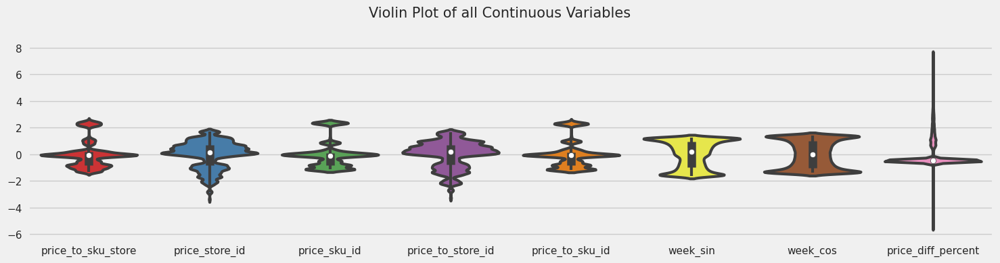

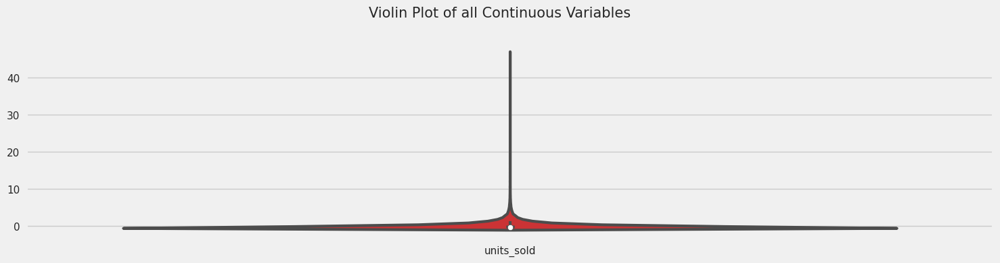

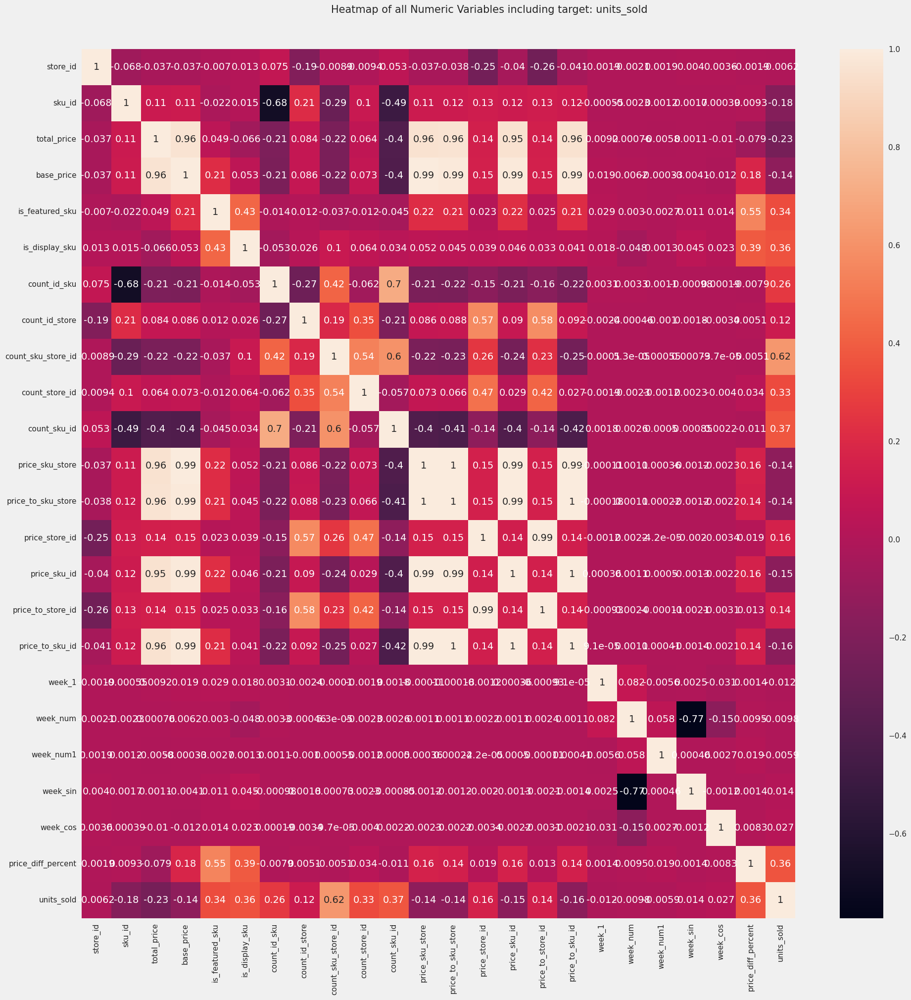

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package movie_reviews is already up-to-date!
[nltk_data]    | Downloading package names to /root/nltk_data...
[nltk_data]    |   Package names is already up-to-date!
[nltk_data]    | Do

Could not draw wordcloud plot for week
All Plots done
Time to run AutoViz = 167 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


,week,store_id,sku_id,total_price,base_price,is_featured_sku,is_display_sku,count_id_sku,count_id_store,count_sku_store_id,count_store_id,count_sku_id,price_sku_store,price_to_sku_store,price_store_id,price_sku_id,price_to_store_id,price_to_sku_id,week_1,week_num,week_num1,week_sin,week_cos,price_diff_percent,units_sold
142018,21-05-2013,9954,217217,237.9750,237.9750,0,0,3380.0,2210.0,9.146154,34.275566,22.260651,232.773750,231.019904,238.132653,241.532862,224.677042,235.160836,123,19,3,0.774910,-0.632072,0.000000,4
138767,07-05-2013,8317,223245,213.0375,213.0375,0,0,9490.0,2600.0,85.300000,51.531154,68.510537,207.600577,199.987788,227.472750,214.878438,215.237207,203.073612,121,17,1,0.903373,-0.428856,0.000000,54
19363,09-05-2011,9745,222765,234.4125,234.4125,0,0,8970.0,2080.0,57.030769,64.406250,53.355184,236.610288,225.226731,221.231250,229.328888,207.683474,219.760497,17,17,1,0.888060,-0.459728,0.000000,40
54336,12-12-2011,8063,216418,69.8250,70.5375,1,0,8840.0,2470.0,47.246154,34.714980,88.923869,82.288269,78.917596,220.264038,94.688268,209.705769,91.982702,48,48,0,-0.478748,0.877952,0.010101,77
46017,17-10-2011,9809,217390,142.5000,165.3000,0,1,9100.0,1690.0,73.738462,60.825444,62.312747,162.943269,152.294135,201.883291,158.990538,190.413728,150.867334,40,40,0,-0.994219,0.107368,0.137931,114
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33893,08-08-2011,9132,216419,69.8250,69.8250,0,0,8710.0,1300.0,15.023077,38.216154,72.182664,80.567308,77.859808,190.596490,94.908763,182.744192,92.349162,30,30,2,-0.455898,-0.890032,0.000000,12
136404,23-04-2013,8222,219029,341.2875,341.2875,0,0,9490.0,2340.0,89.930769,84.405556,47.477661,327.717115,314.305673,230.312276,314.075856,214.541971,301.910425,119,15,3,0.979622,-0.200852,0.000000,133
71756,27-03-2012,8218,217390,158.8875,158.8875,0,0,9100.0,1690.0,21.792308,29.223669,62.312747,152.305096,146.879135,199.233129,158.990538,189.734956,150.867334,63,11,3,0.965735,0.259532,0.000000,18
6995,28-02-2011,8063,245387,455.2875,455.2875,0,0,5590.0,2470.0,26.138462,34.714980,26.862433,466.923173,424.200577,220.264038,477.199106,209.705769,432.891675,7,7,3,0.746971,0.664857,0.000000,11


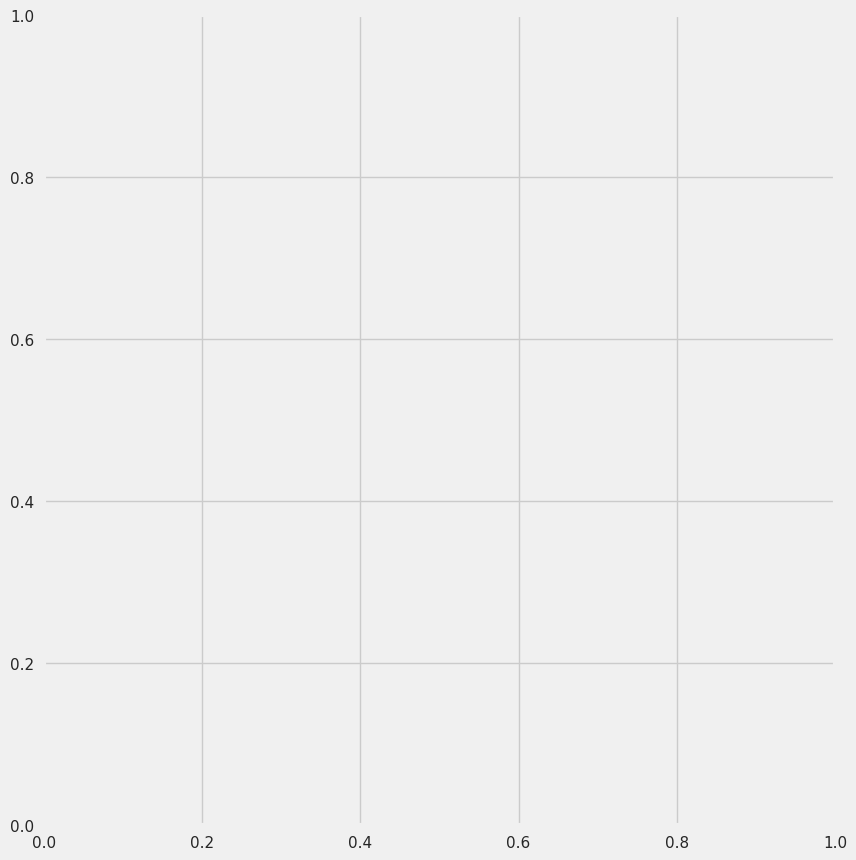

In [20]:
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline
AV = AutoViz_Class()
AV.AutoViz(filename='',dfte=train,depVar='units_sold',verbose=1,max_rows_analyzed=90000
               ,max_cols_analyzed=train.shape[1])

In [45]:
def gen_count_id(train,test,col,name):
    temp=train.groupby(col)['record_ID'].count().reset_index().rename(columns={'record_ID':name})
    train=pd.merge(train,temp,how='left',on=col)
    test=pd.merge(test,temp,how='left',on=col)
    train[name]=train[name].astype(float)
    test[name]=test[name].astype(float)
    train[name].fillna(np.median(temp[name]),inplace=True)
    test[name].fillna(np.median(temp[name]),inplace=True)
    return train,test

def gen_average_units(train,test,col,name):
    temp=train.groupby(col)['units_sold'].mean().reset_index().rename(columns={'units_sold':name})
    train=pd.merge(train,temp,how='left',on=col)
    test=pd.merge(test,temp,how='left',on=col)
    train[name].fillna(np.median(temp[name]),inplace=True)
    test[name].fillna(np.median(temp[name]),inplace=True)
    return train,test

def gen_average_price(train,test,col,price='base_price',name='name'):
    temp=train.groupby(col)[price].mean().reset_index().rename(columns={price:name})
    train=pd.merge(train,temp,how='left',on=col)
    test=pd.merge(test,temp,how='left',on=col)
    train[name].fillna(np.median(temp[name]),inplace=True)
    test[name].fillna(np.median(temp[name]),inplace=True)
    return train,test

In [46]:
train,test = gen_count_id(train,test,col=['sku_id','store_id'],name='count_id_sku_store') #Genearting count of records per 'sku-id & store-id'
train,test = gen_count_id(train,test,col=['sku_id'],name='count_id_sku') #Genearting count of records per 'sku-id'
train,test = gen_count_id(train,test,col=['store_id'],name='count_id_store') #Genearting count of records per 'store-id'

train,test = gen_average_units(train,test,col=['sku_id','store_id'],name='count_sku_store_id') #Genearting average units sold per 'sku-id & store-id'
train,test = gen_average_units(train,test,col=['store_id'],name='count_store_id') #Genearting average units sold per 'store-id'
train,test = gen_average_units(train,test,col=['sku_id'],name='count_sku_id') #Genearting average units sold per 'sku-id'

train,test = gen_average_price(train,test,col=['sku_id','store_id'],price='base_price',name='price_sku_store') #Genearting average base price per 'sku-id & store-id'
train,test = gen_average_price(train,test,col=['sku_id','store_id'],price='total_price',name='price_to_sku_store') #Genearting average total price per 'sku-id & store-id'
train,test = gen_average_price(train,test,col=['store_id'],price='base_price',name='price_store_id') #Genearting average base price per 'store-id'
train,test = gen_average_price(train,test,col=['sku_id'],price='base_price',name='price_sku_id') #Genearting average base price per 'sku-id'
train,test = gen_average_price(train,test,col=['store_id'],price='total_price',name='price_to_store_id') #Genearting average total price per 'store-id'
train,test = gen_average_price(train,test,col=['sku_id'],price='total_price',name='price_to_sku_id') #Genearting average total price per 'sku-id'
#Converting week feature
le = OrdinalEncoder()
train['week_1']=le.fit_transform(train['week'])
le = OrdinalEncoder()
test['week_1']=le.fit_transform(test['week'])+130

#Creating week number feature
train['week_num']=train.week_1%52
test['week_num']=test.week_1%52

train['week_num1']=train.week_1%4
test['week_num1']=test.week_1%4

# Encoding 'week' it using sine and cosine transform; considering it as a cyclic feature
train['week_sin'] = np.sin(2 * np.pi * train['week_1'] / 52.143)
train['week_cos'] = np.cos(2 * np.pi * train['week_1'] / 52.143)
test['week_sin'] = np.sin(2 * np.pi * test['week_1'] / 52.143)
test['week_cos'] = np.cos(2 * np.pi * test['week_1'] / 52.143)

#Creating feature: percent difference between base price and checkout price.
train['price_diff_percent'] = (train['base_price'] - train['total_price']) / train['base_price']
test['price_diff_percent'] = (test['base_price'] - test['total_price']) / test['base_price']

In [ ]:
X=train[list(set(train.columns)-set(['record_ID','units_sold','week']))]
Y= np.log1p(train['units_sold'])
X_test=test[list(set(test.columns)-set(['record_ID','week']))]

In [ ]:
X['sku_id'] = X['sku_id'].astype('category')
X['store_id'] = X['store_id'].astype('category')

In [23]:
category_list=['store_id','sku_id']

In [24]:
encoder_final=MEstimateEncoder()
encoder_final.fit(X[category_list], Y)

cat_enc = encoder_final.transform(X[category_list], Y)
continuous_train = X.drop(columns= category_list)
X = pd.concat([cat_enc,continuous_train],axis=1)

test_enc=encoder_final.transform(X_test[category_list])
continuous_test=X_test.drop(columns= category_list)
X_test=pd.concat([test_enc,continuous_test],axis=1)

In [25]:
del X['week_num1']

KeyError: ignored

In [26]:
x_train, x_valid, y_train, y_valid = train_test_split(X, Y, test_size = 0.2,random_state=23)

In [27]:
rf_base = RandomForestRegressor()
rf_base.fit(x_train,y_train)

RandomForestRegressor()

In [28]:
rf_tuned = RandomForestRegressor(bootstrap=True, max_depth=30,
                      max_features='sqrt', max_leaf_nodes=None,
                      min_impurity_decrease=0.0,
                      min_samples_leaf=1, min_samples_split=10,
                      min_weight_fraction_leaf=0.0, n_estimators=600,
                      n_jobs=None, oob_score=True, random_state=None,
                      verbose=0, warm_start=False)
rf_tuned.fit(x_train,y_train)

RandomForestRegressor(max_depth=30, max_features='sqrt', min_samples_split=10,
                      n_estimators=600, oob_score=True)

In [29]:
model_lgb_base=lgb.LGBMRegressor(objective='regression')
model_lgb_base.fit(x_train,y_train)

model_lgb_tuned=lgb.LGBMRegressor(bagging_fraction=0.8, bagging_frequency=4, boosting_type='gbdt',
              class_weight=None, colsample_bytree=1.0, feature_fraction=0.5,
              importance_type='split', learning_rate=0.1, max_depth=30,
              min_child_samples=20, min_child_weight=30, min_data_in_leaf=70,
              min_split_gain=0.0001, n_estimators=200, n_jobs=-1,
              num_leaves=1200, objective=None, random_state=None, reg_alpha=0.0,
              reg_lambda=0.0, silent=True, subsample=1.0,
              subsample_for_bin=200000, subsample_freq=0)

model_lgb_tuned.fit(x_train,y_train)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.029712 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2409
[LightGBM] [Info] Number of data points in the train set: 120120, number of used features: 22
[LightGBM] [Info] Start training from score 3.585982
[LightGBM] [Warning] Unknown parameter: silent
[LightGBM] [Warning] Unknown parameter: bagging_frequency
[LightGBM] [Warning] min_data_in_leaf is set=70, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=70
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Unknown parameter: silent
[LightGBM] [Warning] Unknown parameter: bagging_frequency
[LightGBM] [Warning] min_data_in_leaf is set=70, min_child_samples=20 will be ign

LGBMRegressor(bagging_fraction=0.8, bagging_frequency=4, feature_fraction=0.5,
              max_depth=30, min_child_weight=30, min_data_in_leaf=70,
              min_split_gain=0.0001, n_estimators=200, n_jobs=-1,
              num_leaves=1200, silent=True)

In [30]:
prediction_rfb_valid=rf_base.predict(x_valid)
prediction_rft_valid=rf_tuned.predict(x_valid)
prediction_lgbmb_valid=model_lgb_base.predict(x_valid)
prediction_lgbmt_valid=model_lgb_tuned.predict(x_valid)

rf_base_msle=100*mean_squared_log_error(y_valid,prediction_rfb_valid)
rf_tuned_msle=100*mean_squared_log_error(y_valid,prediction_rft_valid)
lgbm_base_msle=100*mean_squared_log_error(y_valid,prediction_lgbmb_valid)
lgbm_tuned_msle=100*mean_squared_log_error(y_valid,prediction_lgbmt_valid)

prediction_ensemble_base=(((1-rf_base_msle)*prediction_rfb_valid)+((1-lgbm_base_msle)*prediction_lgbmb_valid))/(2-rf_base_msle-lgbm_base_msle)
prediction_ensemble_tuned=(((1-rf_tuned_msle)*prediction_rft_valid)+((1-lgbm_tuned_msle)*prediction_lgbmt_valid))/(2-rf_tuned_msle-lgbm_tuned_msle)

ensemble_base_msle=100*mean_squared_log_error(y_valid,prediction_ensemble_base)
ensemble_tuned_msle=100*mean_squared_log_error(y_valid,prediction_ensemble_tuned)


print("RF Base: {}; RF Tuned: {}".format(rf_base_msle,rf_tuned_msle))
print("LGBM Base: {}; LGBM Tuned: {}".format(lgbm_base_msle,lgbm_tuned_msle))
print("Ensemble Base: {}; Ensemble Tuned: {}".format(ensemble_base_msle,ensemble_tuned_msle))

[LightGBM] [Warning] Unknown parameter: silent
[LightGBM] [Warning] Unknown parameter: bagging_frequency
[LightGBM] [Warning] min_data_in_leaf is set=70, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=70
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
RF Base: 0.8473652330137604; RF Tuned: 0.8536282060528646
LGBM Base: 0.9005615965495327; LGBM Tuned: 0.7297844675695545
Ensemble Base: 0.8174239835677807; Ensemble Tuned: 0.7467424837532461


In [31]:
model = lgb.LGBMRegressor(bagging_fraction=0.8, bagging_frequency=4, boosting_type='gbdt',
              class_weight=None, colsample_bytree=1.0, feature_fraction=0.5,
              importance_type='split', learning_rate=0.1, max_depth=30,
              min_child_samples=20, min_child_weight=30, min_data_in_leaf=70,
              min_split_gain=0.0001, n_estimators=100, n_jobs=-1,
              num_leaves=1400, objective=None, random_state=None, reg_alpha=0.0,
              reg_lambda=0.0, silent=True, subsample=1.0,
              subsample_for_bin=200000, subsample_freq=0)

model.fit(X,Y)

[LightGBM] [Warning] Unknown parameter: silent
[LightGBM] [Warning] Unknown parameter: bagging_frequency
[LightGBM] [Warning] min_data_in_leaf is set=70, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=70
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Unknown parameter: silent
[LightGBM] [Warning] Unknown parameter: bagging_frequency
[LightGBM] [Warning] min_data_in_leaf is set=70, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=70
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the

LGBMRegressor(bagging_fraction=0.8, bagging_frequency=4, feature_fraction=0.5,
              max_depth=30, min_child_weight=30, min_data_in_leaf=70,
              min_split_gain=0.0001, n_jobs=-1, num_leaves=1400, silent=True)

In [32]:
trainedon = X.columns.tolist()
test2 = test.drop(['week','week_num1'],axis=1)
toteston = test2.columns.tolist()

In [33]:
trainedon.sort()
toteston.sort()
print(trainedon)
print(toteston)

['base_price', 'count_id_sku', 'count_id_sku_store', 'count_id_store', 'count_sku_id', 'count_sku_store_id', 'count_store_id', 'is_display_sku', 'is_featured_sku', 'price_diff_percent', 'price_sku_id', 'price_sku_store', 'price_store_id', 'price_to_sku_id', 'price_to_sku_store', 'price_to_store_id', 'sku_id', 'store_id', 'total_price', 'week_1', 'week_cos', 'week_num', 'week_sin']
['base_price', 'count_id_sku', 'count_id_sku_store', 'count_id_store', 'count_sku_id', 'count_sku_store_id', 'count_store_id', 'is_display_sku', 'is_featured_sku', 'price_diff_percent', 'price_sku_id', 'price_sku_store', 'price_store_id', 'price_to_sku_id', 'price_to_sku_store', 'price_to_store_id', 'record_ID', 'sku_id', 'store_id', 'total_price', 'week_1', 'week_cos', 'week_num', 'week_sin']


In [34]:
X.columns

Index(['store_id', 'sku_id', 'count_id_store', 'price_sku_id',
       'price_to_sku_store', 'count_sku_store_id', 'price_sku_store',
       'is_featured_sku', 'is_display_sku', 'price_to_store_id', 'total_price',
       'count_id_sku_store', 'count_store_id', 'week_num', 'count_id_sku',
       'week_cos', 'price_to_sku_id', 'price_store_id', 'base_price',
       'week_sin', 'count_sku_id', 'price_diff_percent', 'week_1'],
      dtype='object')

In [35]:
desired_column_order = ['store_id', 'sku_id', 'count_sku_store_id', 'price_diff_percent',
       'week_sin', 'week_num', 'price_to_sku_id', 'is_display_sku',
       'price_store_id', 'price_sku_id', 'is_featured_sku', 'count_sku_id',
       'total_price', 'price_to_store_id', 'price_sku_store', 'count_store_id',
       'count_id_sku', 'week_cos', 'base_price', 'count_id_sku_store',
       'week_1', 'price_to_sku_store', 'count_id_store','record_ID']
test3 = test2[desired_column_order]

In [36]:
predicted_values = model.predict(test3.drop("record_ID",axis=1))

[LightGBM] [Warning] Unknown parameter: silent
[LightGBM] [Warning] Unknown parameter: bagging_frequency
[LightGBM] [Warning] min_data_in_leaf is set=70, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=70
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8


In [37]:
output_df = test3[['record_ID']].copy()

In [38]:
predicted_values = np.expm1(predicted_values)

In [39]:
output_df['units_sold'] = predicted_values

In [40]:
output_df['units_sold'].min()

58.59134802798535

In [41]:
train['units_sold'].min()

1

In [48]:
output_df

,record_ID,units_sold
0,212645,64.423685
1,212646,64.423685
2,212647,68.433603
3,212648,68.433603
4,212649,68.455018
...,...,...
13855,232281,98.147456
13856,232282,98.147456
13857,232285,133.047606
13858,232286,96.151854


In [49]:
output_df.to_csv("submit.csv")